INFO:Loaded Major Roads shapefile from geo_export_6fb64bd2-1486-42ae-a162-088749b8dd80.shp.
INFO:Loaded Subway shapefile from geo_export_74ce3440-6a1b-4595-b6ba-da91a69cc801.shp.
INFO:Loaded Borough Boundaries shapefile from geo_export_28264e33-3c53-4dcc-8a72-2ae6bb3e4374.shp.
INFO:Loaded Borough Boundaries with Water shapefile from geo_export_7b9920aa-ade9-4cb6-8879-a452ceacbd9b.shp.
INFO:Loaded Points of Interest (POIs) shapefile from geo_export_a217869d-a028-4bb8-a749-5d35d34a6455.shp.
INFO:Loaded Building Boundaries shapefile from geo_export_bb2df38d-e539-4500-af5b-f5ca46422ec2.shp.
INFO:Loaded Land shapefile from MapPLUTO_UNCLIPPED.shp.
INFO:Reprojected Land to EPSG:4326.
INFO:Converted parking places to GeoDataFrame.


/var/folders/x3/v2cg1h1926b4vrm90ffhpb4h0000gn/T/ipykernel_1700/278139552.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap('tab20', len(unique_facility_types))  # Use a colormap for facility types


INFO:Map saved successfully at nyc_map_facility_types.png.


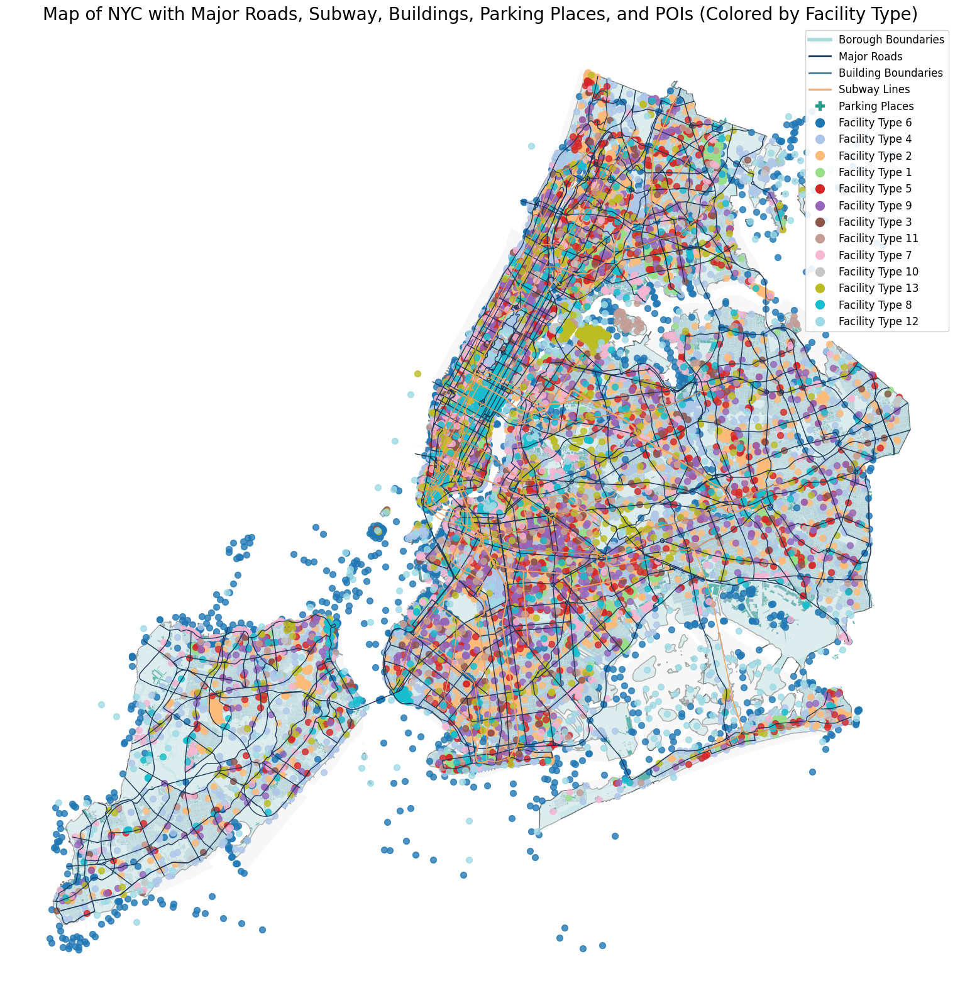

In [1]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import shapely.wkt
from matplotlib.lines import Line2D
from matplotlib.cm import get_cmap
import logging
import sys

# Configure logging
logging.basicConfig(
    level=logging.INFO,
    format='%(levelname)s:%(message)s',
    handlers=[
        logging.StreamHandler(sys.stdout)
    ]
)

# Paths to shapefiles and CSV
path_major_roads = 'geo_export_6fb64bd2-1486-42ae-a162-088749b8dd80.shp'
path_subway = 'geo_export_74ce3440-6a1b-4595-b6ba-da91a69cc801.shp'
path_borough_boundaries = 'geo_export_28264e33-3c53-4dcc-8a72-2ae6bb3e4374.shp'
path_borough_with_water = 'geo_export_7b9920aa-ade9-4cb6-8879-a452ceacbd9b.shp'
path_pois = 'geo_export_a217869d-a028-4bb8-a749-5d35d34a6455.shp'
path_building_boundaries = 'geo_export_bb2df38d-e539-4500-af5b-f5ca46422ec2.shp'
path_land = 'MapPLUTO_UNCLIPPED.shp'
path_parking_places = 'your_parking_places.csv'  # Update with your actual path

# Define a common CRS (WGS84)
common_crs = 'EPSG:4326'

# Function to load shapefiles with error handling and CRS alignment
def load_shapefile(path, label):
    try:
        gdf = gpd.read_file(path)
        logging.info(f"Loaded {label} shapefile from {path}.")
        # Reproject to common CRS if necessary
        if gdf.crs != common_crs:
            gdf = gdf.to_crs(common_crs)
            logging.info(f"Reprojected {label} to {common_crs}.")
        return gdf
    except FileNotFoundError:
        logging.error(f"File not found: {path}")
        sys.exit(1)
    except Exception as e:
        logging.error(f"Error loading {label} shapefile: {e}")
        sys.exit(1)

# Load shapefiles as GeoDataFrames
gdf_major_roads = load_shapefile(path_major_roads, "Major Roads")
gdf_subway = load_shapefile(path_subway, "Subway")
gdf_borough_boundaries = load_shapefile(path_borough_boundaries, "Borough Boundaries")
gdf_borough_with_water = load_shapefile(path_borough_with_water, "Borough Boundaries with Water")
gdf_pois = load_shapefile(path_pois, "Points of Interest (POIs)")
gdf_building_boundaries = load_shapefile(path_building_boundaries, "Building Boundaries")
gdf_land = load_shapefile(path_land, "Land")

# Load parking places from CSV
try:
    df_parking_places = pd.read_csv(path_parking_places)
    df_parking_places['geometry'] = df_parking_places['the_geom'].apply(shapely.wkt.loads)
    df_parking_places = df_parking_places.dropna(subset=['geometry'])
    gdf_parking_places = gpd.GeoDataFrame(df_parking_places, geometry='geometry', crs=common_crs)
    logging.info("Converted parking places to GeoDataFrame.")
except Exception as e:
    logging.error(f"Error loading parking places: {e}")
    sys.exit(1)

# Define bounding box for NYC
nyc_minx, nyc_maxx = -74.25909, -73.70018
nyc_miny, nyc_maxy = 40.477399, 40.917577

# Apply bounding box filter
gdf_major_roads_nyc = gdf_major_roads.cx[nyc_minx:nyc_maxx, nyc_miny:nyc_maxy]
gdf_borough_boundaries_nyc = gdf_borough_boundaries
gdf_building_boundaries_nyc = gdf_building_boundaries.cx[nyc_minx:nyc_maxx, nyc_miny:nyc_maxy]
gdf_pois_nyc = gdf_pois.cx[nyc_minx:nyc_maxx, nyc_miny:nyc_maxy]
gdf_subway_nyc = gdf_subway.cx[nyc_minx:nyc_maxx, nyc_miny:nyc_maxy]
gdf_parking_places_nyc = gdf_parking_places.cx[nyc_minx:nyc_maxx, nyc_miny:nyc_maxy]

# Plotting the map
fig, ax = plt.subplots(figsize=(20, 20))

# Plot borough boundaries
gdf_borough_boundaries_nyc.plot(ax=ax, color='#A8DADC', edgecolor='black', linewidth=1, alpha=0.6, label='Borough Boundaries')

# Plot land
gdf_land.plot(ax=ax, color='#F0F0F0', alpha=0.5, label='Land')

# Plot major roads
gdf_major_roads_nyc.plot(ax=ax, color='#1D3557', linewidth=1, label='Major Roads')

# Plot subway lines
gdf_subway_nyc.plot(ax=ax, color='#F4A261', linewidth=1, label='Subway Lines')

# Plot building boundaries
gdf_building_boundaries_nyc.plot(ax=ax, color='#457B9D', alpha=0.5, linewidth=0.5, label='Building Boundaries')

# Plot parking places
if not gdf_parking_places_nyc.empty:
    gdf_parking_places_nyc.plot(ax=ax, color='#2A9D8F', markersize=30, marker='P', label='Parking Places', alpha=0.7)

# Plot all POIs with unique colors for each facility type
if not gdf_pois_nyc.empty:
    unique_facility_types = gdf_pois_nyc['facility_t'].unique()
    cmap = get_cmap('tab20', len(unique_facility_types))  # Use a colormap for facility types
    for i, facility in enumerate(unique_facility_types):
        facility_pois = gdf_pois_nyc[gdf_pois_nyc['facility_t'] == facility]
        facility_pois.plot(
            ax=ax,
            color=cmap(i),
            markersize=50,
            marker='o',
            label=f'Facility Type {int(facility)}',
            alpha=0.8
        )

# Final touches
ax.set_title('Map of NYC with Major Roads, Subway, Buildings, Parking Places, and POIs (Colored by Facility Type)', fontsize=20)
ax.set_axis_off()

# Create a custom legend for POIs
legend_elements = [
    Line2D([0], [0], color='#A8DADC', lw=4, label='Borough Boundaries'),
    Line2D([0], [0], color='#1D3557', lw=2, label='Major Roads'),
    Line2D([0], [0], color='#457B9D', lw=2, label='Building Boundaries'),
    Line2D([0], [0], color='#F4A261', lw=2, label='Subway Lines'),
    Line2D([0], [0], marker='P', color='#2A9D8F', markersize=10, linestyle='None', label='Parking Places')
]
legend_elements += [
    Line2D([0], [0], marker='o', color=cmap(i), markersize=10, linestyle='None', label=f'Facility Type {int(facility)}')
    for i, facility in enumerate(unique_facility_types)
]
ax.legend(handles=legend_elements, loc='upper right', fontsize='large', framealpha=0.9)

# Save and show the plot
output_path = 'nyc_map_facility_types.png'
try:
    plt.savefig(output_path, dpi=300, bbox_inches='tight')
    logging.info(f"Map saved successfully at {output_path}.")
except Exception as e:
    logging.error(f"Error saving the map: {e}")

plt.show()


INFO:Loaded Major Roads shapefile from geo_export_6fb64bd2-1486-42ae-a162-088749b8dd80.shp.
INFO:Loaded Subway shapefile from geo_export_74ce3440-6a1b-4595-b6ba-da91a69cc801.shp.
INFO:Loaded Borough Boundaries shapefile from geo_export_28264e33-3c53-4dcc-8a72-2ae6bb3e4374.shp.
INFO:Loaded Borough Boundaries with Water shapefile from geo_export_7b9920aa-ade9-4cb6-8879-a452ceacbd9b.shp.
INFO:Loaded Points of Interest (POIs) shapefile from geo_export_a217869d-a028-4bb8-a749-5d35d34a6455.shp.
INFO:Loaded Building Boundaries shapefile from geo_export_bb2df38d-e539-4500-af5b-f5ca46422ec2.shp.
INFO:Loaded Land shapefile from MapPLUTO_UNCLIPPED.shp.
INFO:Reprojected Land to EPSG:4326.
INFO:
--- Major Roads ---
INFO:Columns: ['borough', 'boro_code', 'route_name', 'route_type', 'route_sub', 'route_stat', 'geometry']
INFO:Sample Data:
     borough  boro_code        route_name     route_type  \
0  Manhattan        1.0          2 Avenue  Major Streets   
1  Manhattan        1.0         10 Avenue  M

/var/folders/x3/v2cg1h1926b4vrm90ffhpb4h0000gn/T/ipykernel_1700/2290574809.py:226: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  parking_coords = gdf_parking_borough.geometry.centroid


INFO:Plotted parking places density for Manhattan.
INFO:No POIs with facility_t = 9.0 found to plot for Manhattan.
INFO:Map for Manhattan saved successfully at manhattan_map.png.


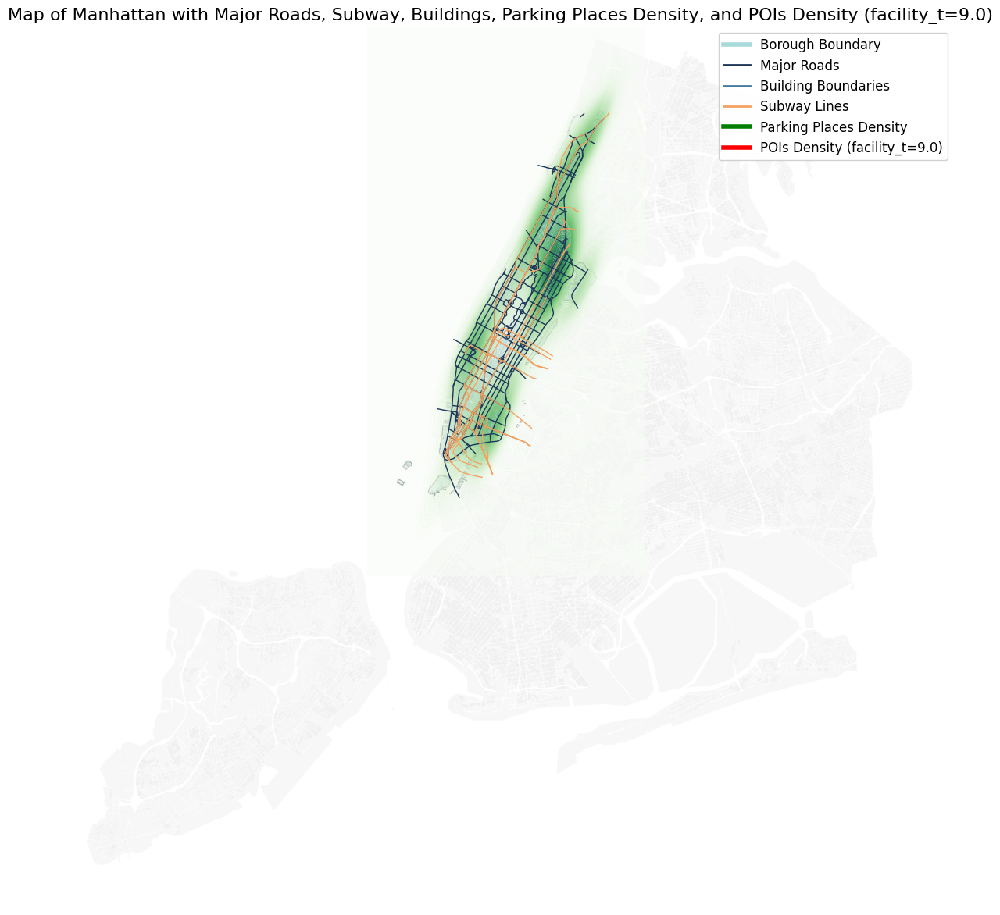

INFO:Generating map for Brooklyn.


/var/folders/x3/v2cg1h1926b4vrm90ffhpb4h0000gn/T/ipykernel_1700/2290574809.py:226: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  parking_coords = gdf_parking_borough.geometry.centroid


INFO:Plotted parking places density for Brooklyn.
INFO:No POIs with facility_t = 9.0 found to plot for Brooklyn.
INFO:Map for Brooklyn saved successfully at brooklyn_map.png.


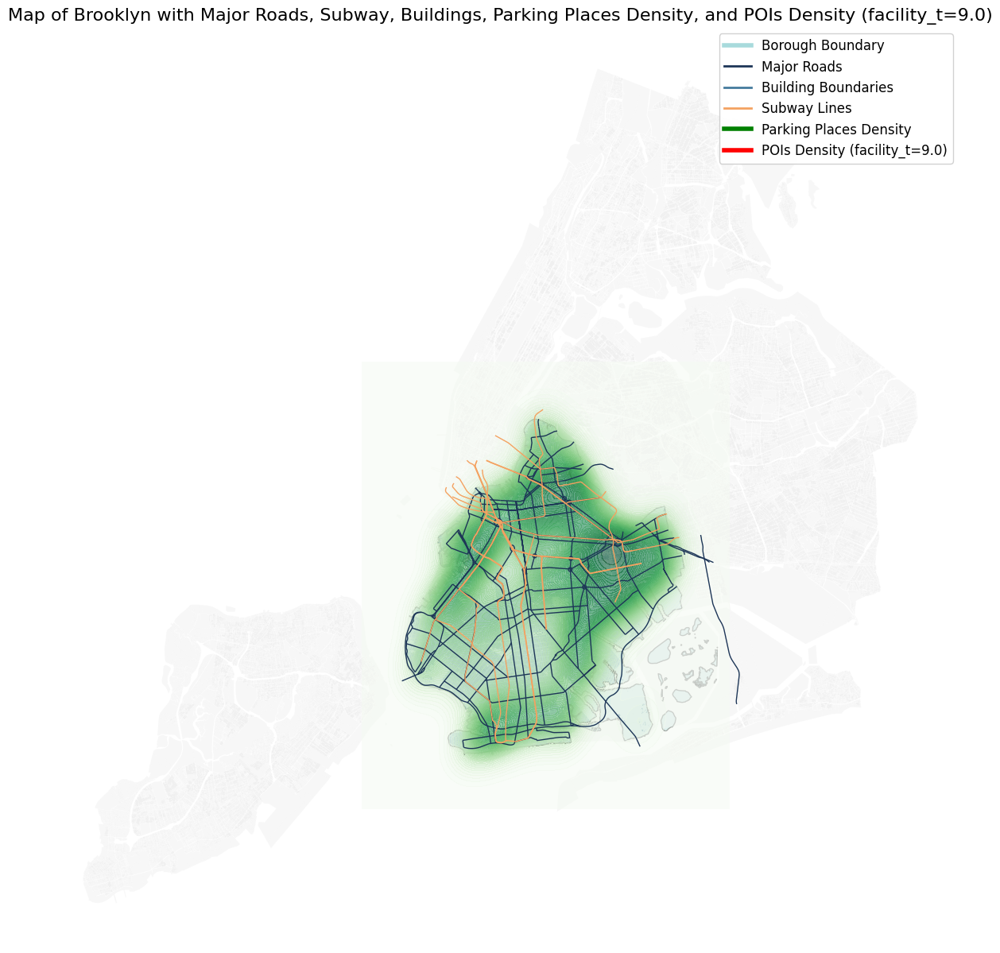

INFO:Generating map for Queens.


/var/folders/x3/v2cg1h1926b4vrm90ffhpb4h0000gn/T/ipykernel_1700/2290574809.py:226: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  parking_coords = gdf_parking_borough.geometry.centroid


INFO:Plotted parking places density for Queens.
INFO:No POIs with facility_t = 9.0 found to plot for Queens.
INFO:Map for Queens saved successfully at queens_map.png.


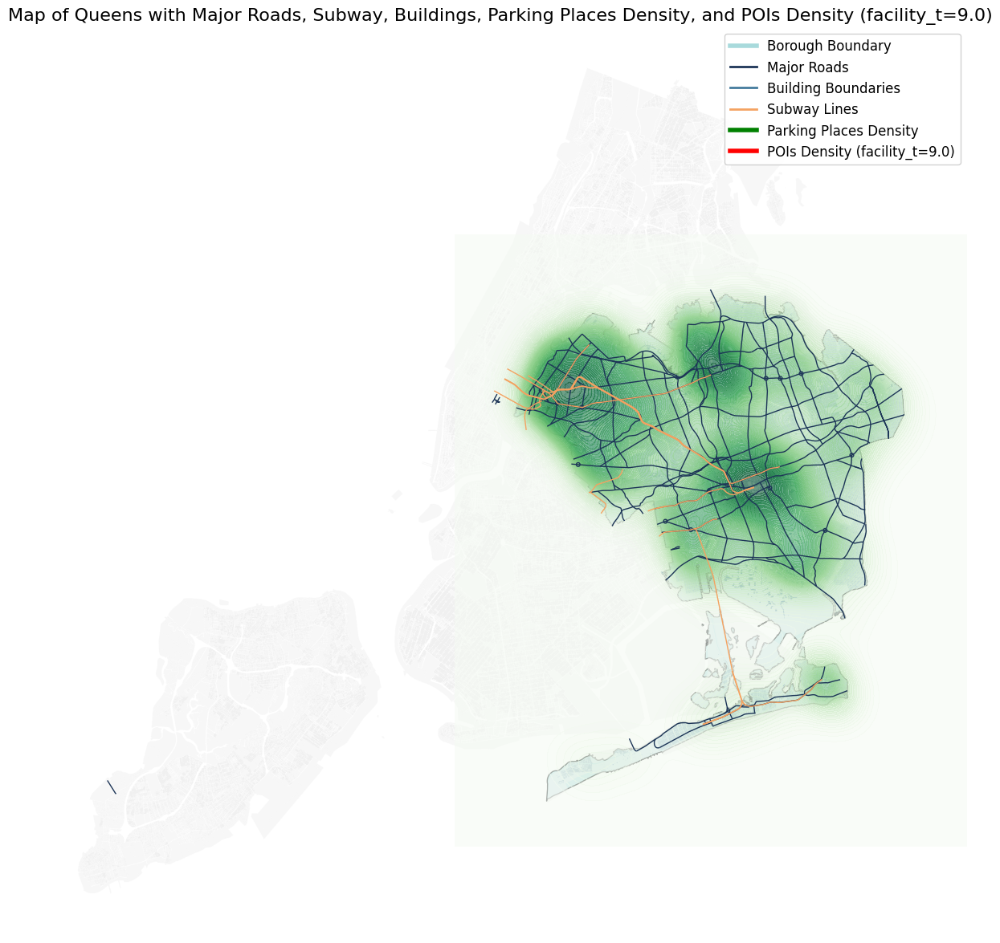

INFO:Generating map for Bronx.


/var/folders/x3/v2cg1h1926b4vrm90ffhpb4h0000gn/T/ipykernel_1700/2290574809.py:226: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  parking_coords = gdf_parking_borough.geometry.centroid


INFO:Plotted parking places density for Bronx.
INFO:No POIs with facility_t = 9.0 found to plot for Bronx.
INFO:Map for Bronx saved successfully at bronx_map.png.


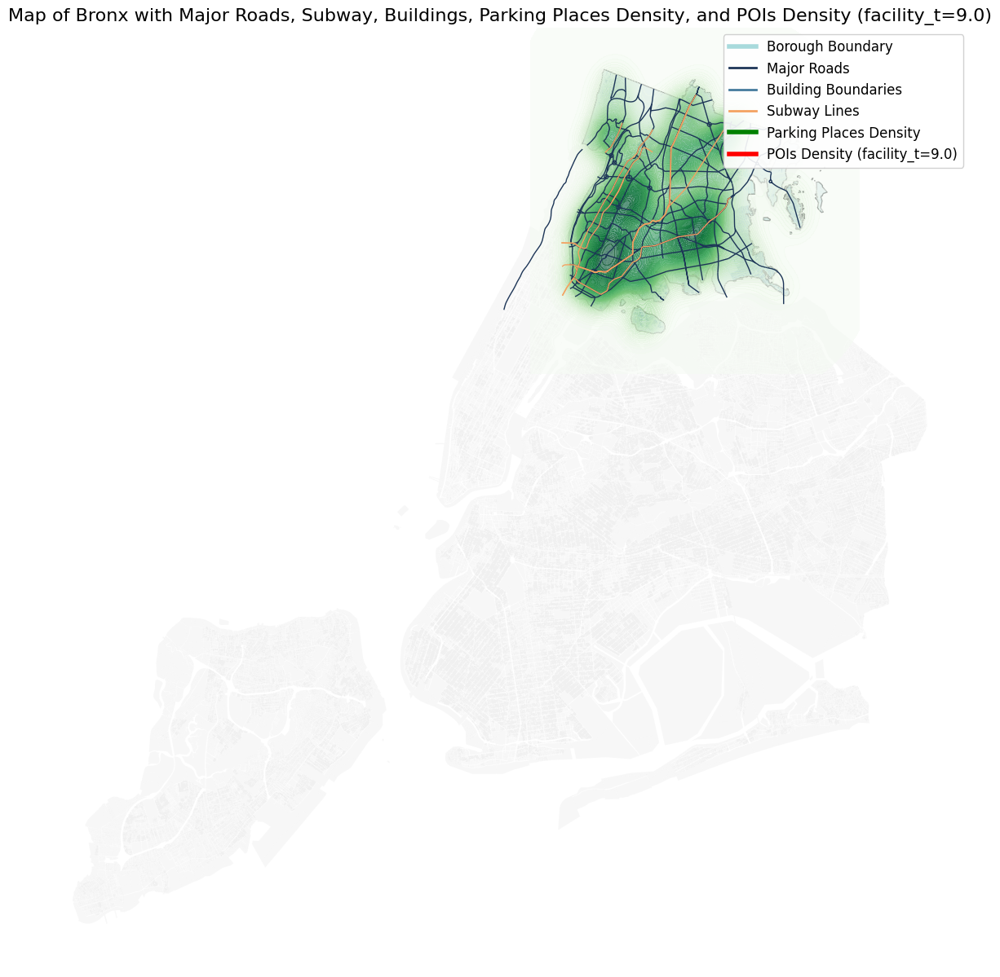

INFO:Generating map for Staten Island.


ValueError: aspect must be finite and positive 

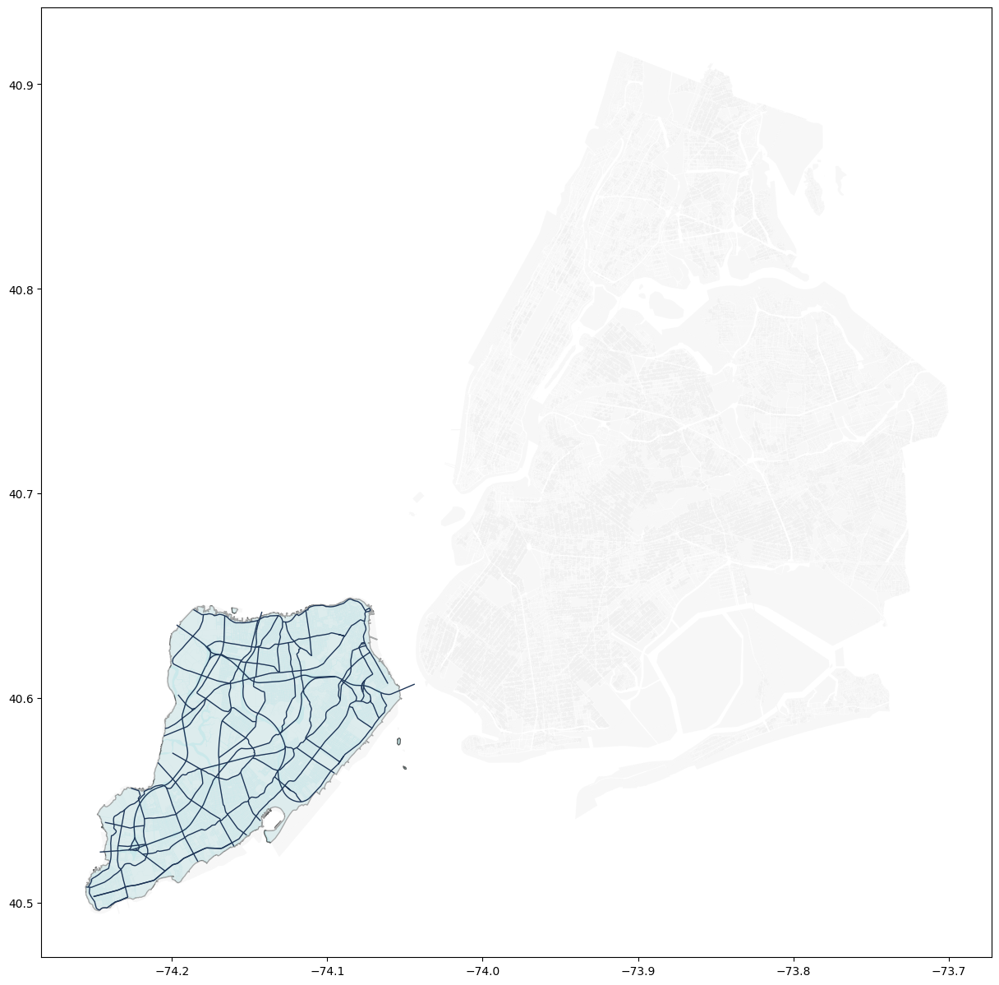

In [2]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import shapely.wkt
import seaborn as sns
from matplotlib.lines import Line2D
import logging
import sys
from shapely.geometry import Polygon, MultiPolygon
from shapely.ops import unary_union

# Configure logging
logging.basicConfig(
    level=logging.INFO,
    format='%(levelname)s:%(message)s',
    handlers=[
        logging.StreamHandler(sys.stdout)
    ]
)

# Paths to shapefiles and CSV
path_major_roads = 'geo_export_6fb64bd2-1486-42ae-a162-088749b8dd80.shp'
path_subway = 'geo_export_74ce3440-6a1b-4595-b6ba-da91a69cc801.shp'
path_borough_boundaries = 'geo_export_28264e33-3c53-4dcc-8a72-2ae6bb3e4374.shp'
path_borough_with_water = 'geo_export_7b9920aa-ade9-4cb6-8879-a452ceacbd9b.shp'
path_pois = 'geo_export_a217869d-a028-4bb8-a749-5d35d34a6455.shp'
path_building_boundaries = 'geo_export_bb2df38d-e539-4500-af5b-f5ca46422ec2.shp'
path_land = 'MapPLUTO_UNCLIPPED.shp'
path_parking_places = 'your_parking_places.csv'  # Update with your actual path

# Define a common CRS (WGS84)
common_crs = 'EPSG:4326'

# Mapping of borough codes to names
boro_code_to_name = {
    1.0: 'Manhattan',
    2.0: 'Bronx',
    3.0: 'Brooklyn',
    4.0: 'Queens',
    5.0: 'Staten Island'
}

# List of boroughs
boroughs = ['Manhattan', 'Brooklyn', 'Queens', 'Bronx', 'Staten Island']

# Function to load shapefiles with error handling and CRS alignment
def load_shapefile(path, label):
    try:
        gdf = gpd.read_file(path)
        logging.info(f"Loaded {label} shapefile from {path}.")
        # Reproject to common CRS if necessary
        if gdf.crs != common_crs:
            gdf = gdf.to_crs(common_crs)
            logging.info(f"Reprojected {label} to {common_crs}.")
        return gdf
    except FileNotFoundError:
        logging.error(f"File not found: {path}")
        sys.exit(1)
    except Exception as e:
        logging.error(f"Error loading {label} shapefile: {e}")
        sys.exit(1)

# Function to inspect GeoDataFrames
def inspect_shapefile(gdf, label, num_samples=5):
    logging.info(f"\n--- {label} ---")
    logging.info(f"Columns: {gdf.columns.tolist()}")
    logging.info(f"Sample Data:\n{gdf.head(num_samples)}")

# Load shapefiles as GeoDataFrames
gdf_major_roads = load_shapefile(path_major_roads, "Major Roads")
gdf_subway = load_shapefile(path_subway, "Subway")
gdf_borough_boundaries = load_shapefile(path_borough_boundaries, "Borough Boundaries")
gdf_borough_with_water = load_shapefile(path_borough_with_water, "Borough Boundaries with Water")
gdf_pois = load_shapefile(path_pois, "Points of Interest (POIs)")
gdf_building_boundaries = load_shapefile(path_building_boundaries, "Building Boundaries")
gdf_land = load_shapefile(path_land, "Land")

# Inspect the structure of each dataset
inspect_shapefile(gdf_major_roads, "Major Roads")
inspect_shapefile(gdf_subway, "Subway")
inspect_shapefile(gdf_borough_boundaries, "Borough Boundaries")
inspect_shapefile(gdf_borough_with_water, "Borough Boundaries with Water")
inspect_shapefile(gdf_pois, "Points of Interest (POIs)")
inspect_shapefile(gdf_building_boundaries, "Building Boundaries")
inspect_shapefile(gdf_land, "Land")

# Load parking places from CSV with error handling
try:
    df_parking_places = pd.read_csv(path_parking_places)
    logging.info(f"Loaded parking places CSV from {path_parking_places}.")
except FileNotFoundError:
    logging.error(f"CSV file not found at path: {path_parking_places}")
    sys.exit(1)
except Exception as e:
    logging.error(f"Error loading parking places CSV: {e}")
    sys.exit(1)

# Validate presence of 'the_geom' column
if 'the_geom' not in df_parking_places.columns:
    logging.error("'the_geom' column not found in parking places CSV.")
    sys.exit(1)

# Parse WKT geometries with error handling
def parse_wkt(wkt_str):
    try:
        return shapely.wkt.loads(wkt_str)
    except Exception as e:
        logging.warning(f"Error parsing WKT: {e}")
        return None

df_parking_places['geometry'] = df_parking_places['the_geom'].apply(parse_wkt)
df_parking_places = df_parking_places.dropna(subset=['geometry'])

# Convert to GeoDataFrame
gdf_parking_places = gpd.GeoDataFrame(df_parking_places, geometry='geometry', crs=common_crs)
logging.info("Converted parking places to GeoDataFrame.")

# Function to validate required columns
def validate_columns(gdf, required_cols, label):
    missing_cols = [col for col in required_cols if col not in gdf.columns]
    if missing_cols:
        logging.error(f"Missing columns in {label}: {missing_cols}")
        sys.exit(1)
    else:
        logging.info(f"All required columns present in {label}.")

# Validate necessary columns
validate_columns(gdf_major_roads, ['borough'], "Major Roads")
validate_columns(gdf_borough_boundaries, ['boro_name'], "Borough Boundaries")
validate_columns(gdf_pois, ['facility_t', 'borough'], "Points of Interest (POIs)")

# Map 'borough' codes to names in POIs
gdf_pois['borough_name'] = gdf_pois['borough'].map(boro_code_to_name)
if gdf_pois['borough_name'].isnull().any():
    logging.warning("Some POIs have undefined borough codes.")

# Define bounding box for all boroughs (New York City)
# Approximate bounding box coordinates for NYC
# minx, maxx, miny, maxy
nyc_minx, nyc_maxx = -74.25909, -73.70018  # Longitude range
nyc_miny, nyc_maxy = 40.477399, 40.917577  # Latitude range

# Apply bounding box filter to include all boroughs
gdf_major_roads_nyc = gdf_major_roads.cx[nyc_minx:nyc_maxx, nyc_miny:nyc_maxy]
gdf_building_boundaries_nyc = gdf_building_boundaries.cx[nyc_minx:nyc_maxx, nyc_miny:nyc_maxy]
gdf_pois_nyc = gdf_pois.cx[nyc_minx:nyc_maxx, nyc_miny:nyc_maxy]
gdf_subway_nyc = gdf_subway.cx[nyc_minx:nyc_maxx, nyc_miny:nyc_maxy]
gdf_parking_places_nyc = gdf_parking_places.cx[nyc_minx:nyc_maxx, nyc_miny:nyc_maxy]  # Filter for NYC parking places

logging.info("Applied bounding box filter for New York City.")

# Filter POIs for facility_t == 9.0
initial_poi_count = len(gdf_pois_nyc)
gdf_pois_nyc = gdf_pois_nyc[gdf_pois_nyc['facility_t'] == 9.0]
filtered_poi_count = len(gdf_pois_nyc)
logging.info(f"Filtered POIs: {filtered_poi_count} out of {initial_poi_count} with facility_t == 9.0.")

# Function to get representative point
def get_representative_point(geom):
    try:
        return geom.representative_point()
    except Exception as e:
        logging.warning(f"Error getting representative point: {e}")
        return None

# Function to plot and save map for a given borough
def plot_borough_map(borough_name, boundary_geom):
    logging.info(f"Generating map for {borough_name}.")

    # Create a figure and axis
    fig, ax = plt.subplots(figsize=(15, 15))

    # Create a GeoDataFrame for the borough boundary
    gdf_boundary = gpd.GeoDataFrame({'geometry': [boundary_geom]}, crs=common_crs)

    # Plot borough boundary
    gdf_boundary.plot(
        ax=ax,
        color='#A8DADC',
        edgecolor='black',
        linewidth=1,
        alpha=0.6,
        label='Borough Boundary'
    )

    # Plot land
    gdf_land.plot(
        ax=ax,
        color='#F0F0F0',
        alpha=0.5,
        label='Land'
    )

    # Plot major roads
    gdf_major_roads_nyc[gdf_major_roads_nyc['borough'] == borough_name].plot(
        ax=ax,
        color='#1D3557',
        linewidth=1,
        label='Major Roads'
    )

    # Plot subway lines (spatial intersection with borough boundary)
    # Directly use boundary_geom for intersection without unary_union
    gdf_subway_borough = gdf_subway_nyc[gdf_subway_nyc.intersects(boundary_geom)]
    gdf_subway_borough.plot(
        ax=ax,
        color='#F4A261',
        linewidth=1,
        label='Subway Lines'
    )

    # Plot building boundaries (spatial intersection with borough boundary)
    gdf_building_borough = gdf_building_boundaries_nyc[gdf_building_boundaries_nyc.intersects(boundary_geom)]
    gdf_building_borough.plot(
        ax=ax,
        color='#457B9D',
        alpha=0.5,
        linewidth=0.5,
        label='Building Boundaries'
    )

    # Plot parking places as heatmap using KDE
    gdf_parking_borough = gdf_parking_places_nyc[gdf_parking_places_nyc.intersects(boundary_geom)]
    if not gdf_parking_borough.empty:
        # Extract centroid coordinates
        parking_coords = gdf_parking_borough.geometry.centroid
        parking_x = parking_coords.x
        parking_y = parking_coords.y

        # Create KDE plot for parking places
        sns.kdeplot(
            x=parking_x,
            y=parking_y,
            fill=True,
            cmap='Greens',
            alpha=0.5,
            thresh=0,
            levels=100,
            ax=ax,
            label='Parking Places Density'
        )
        logging.info(f"Plotted parking places density for {borough_name}.")
    else:
        logging.info(f"No parking places found to plot for {borough_name}.")

    # Plot POIs as heatmap using KDE
    gdf_pois_borough = gdf_pois_nyc[gdf_pois_nyc['borough_name'] == borough_name]
    if not gdf_pois_borough.empty:
        # Extract centroid coordinates
        pois_coords = gdf_pois_borough.geometry.centroid
        pois_x = pois_coords.x
        pois_y = pois_coords.y

        # Create KDE plot for POIs
        sns.kdeplot(
            x=pois_x,
            y=pois_y,
            fill=True,
            cmap='Reds',
            alpha=0.5,
            thresh=0,
            levels=100,
            ax=ax,
            label='POIs Density (facility_t=9.0)'
        )
        logging.info(f"Plotted POIs density for {borough_name}.")
    else:
        logging.info(f"No POIs with facility_t = 9.0 found to plot for {borough_name}.")

    # Final touches
    ax.set_title(
        f'Map of {borough_name} with Major Roads, Subway, Buildings, Parking Places Density, and POIs Density (facility_t=9.0)',
        fontsize=16
    )
    ax.set_axis_off()

    # Create a custom legend to better represent colors and layers
    legend_elements = [
        Line2D([0], [0], color='#A8DADC', lw=4, label='Borough Boundary'),
        Line2D([0], [0], color='#1D3557', lw=2, label='Major Roads'),
        Line2D([0], [0], color='#457B9D', lw=2, label='Building Boundaries'),
        Line2D([0], [0], color='#F4A261', lw=2, label='Subway Lines'),
        Line2D([0], [0], color='green', lw=4, label='Parking Places Density'),
        Line2D([0], [0], color='red', lw=4, label='POIs Density (facility_t=9.0)')
    ]

    ax.legend(handles=legend_elements, loc='upper right', fontsize='large', framealpha=0.9)

    # Save the plot
    output_path = f'{borough_name.lower().replace(" ", "_")}_map.png'
    try:
        plt.savefig(output_path, dpi=300, bbox_inches='tight')
        logging.info(f"Map for {borough_name} saved successfully at {output_path}.")
    except Exception as e:
        logging.error(f"Error saving the map for {borough_name}: {e}")

    # Show the plot
    plt.show()
    plt.close()

# Iterate over each borough and generate separate maps
for boro in boroughs:
    # Get the boundary geometry for the borough
    boundary = gdf_borough_boundaries[gdf_borough_boundaries['boro_name'] == boro]
    if boundary.empty:
        logging.warning(f"No boundary found for {boro}. Skipping map generation.")
        continue
    boundary_geom = boundary.geometry.iloc[0]

    # Plot and save the map for the borough
    plot_borough_map(boro, boundary_geom)


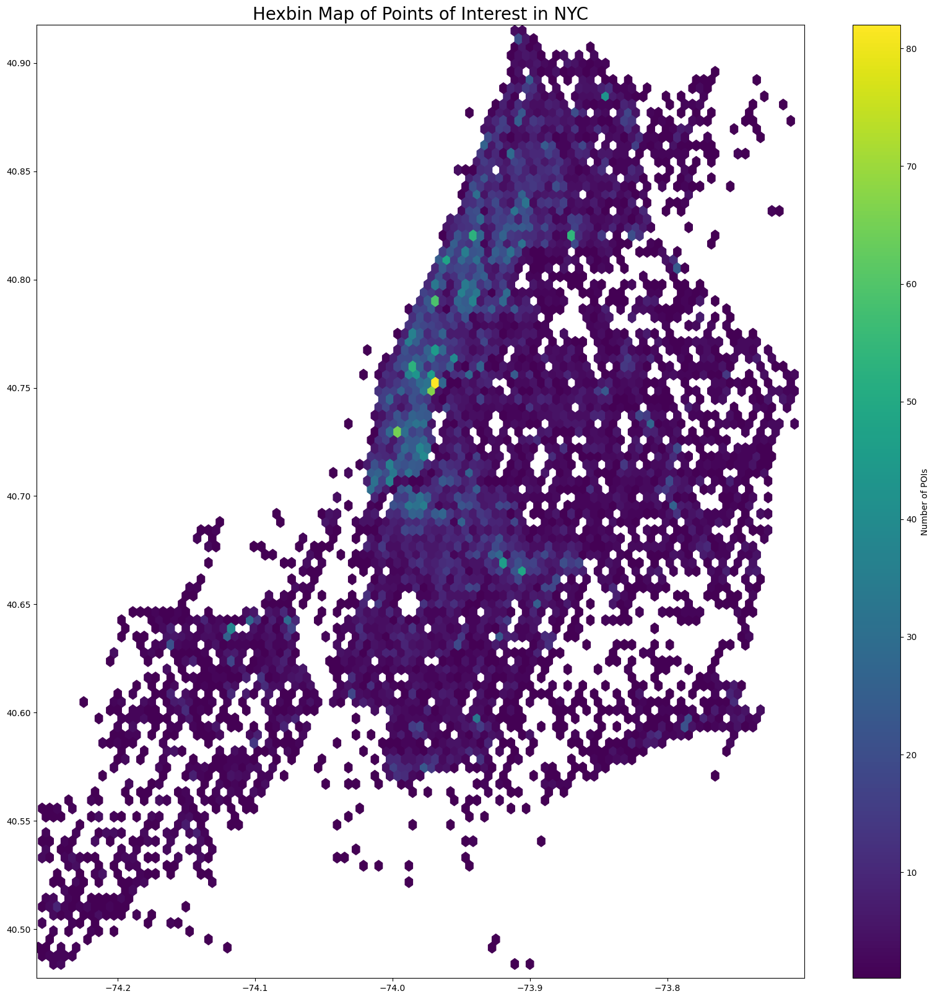

In [3]:
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np

# Load POIs
path_pois = 'geo_export_a217869d-a028-4bb8-a749-5d35d34a6455.shp'
gdf_pois = gpd.read_file(path_pois)

# Define NYC bounding box
nyc_minx, nyc_maxx = -74.25909, -73.70018
nyc_miny, nyc_maxy = 40.477399, 40.917577

# Filter POIs within NYC bounding box
gdf_pois_nyc = gdf_pois.cx[nyc_minx:nyc_maxx, nyc_miny:nyc_maxy]

# Extract coordinates for hexbin
poi_coords = np.array(list(zip(gdf_pois_nyc.geometry.x, gdf_pois_nyc.geometry.y)))

# Create Hexbin Plot
fig, ax = plt.subplots(figsize=(20, 20))
hb = ax.hexbin(
    poi_coords[:, 0], poi_coords[:, 1],
    gridsize=100,  # Number of hexagons
    cmap='viridis',  # Color map
    mincnt=1  # Minimum count to display
)

# Add colorbar and title
cb = fig.colorbar(hb, ax=ax)
cb.set_label('Number of POIs')
ax.set_title('Hexbin Map of Points of Interest in NYC', fontsize=20)
ax.set_xlim(nyc_minx, nyc_maxx)
ax.set_ylim(nyc_miny, nyc_maxy)

# Save and show the plot
plt.savefig('nyc_hexbin_map.png', dpi=300, bbox_inches='tight')
plt.show()


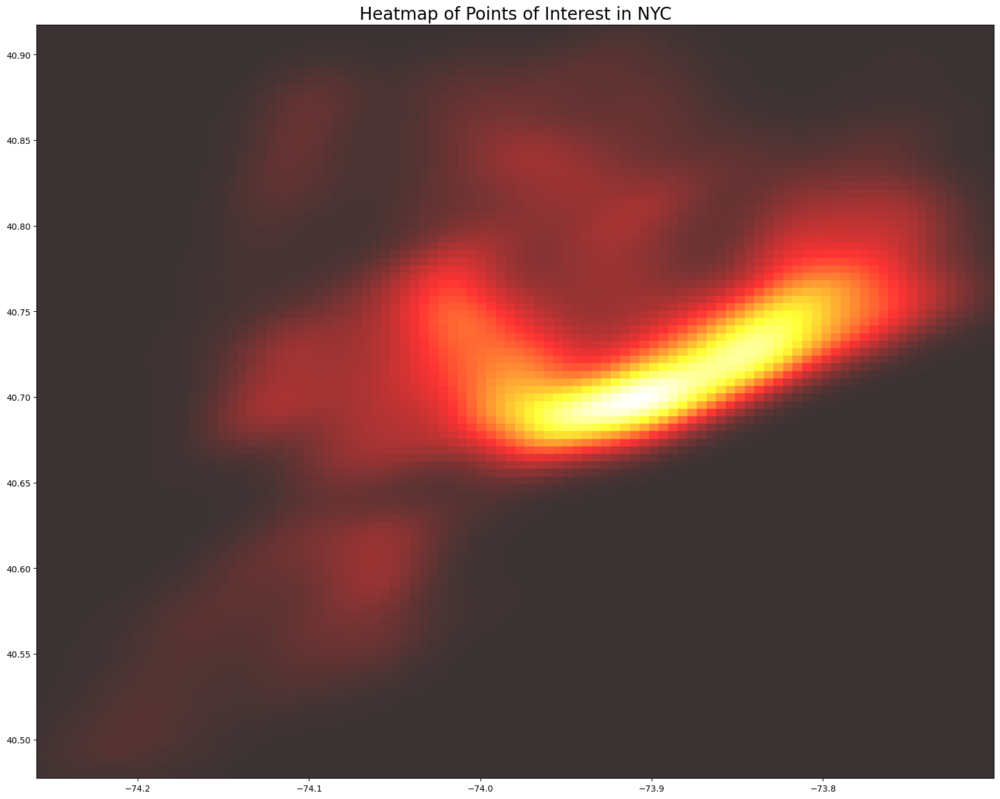

In [4]:
from scipy.stats import gaussian_kde

# Kernel Density Estimation for heatmap
xy = np.vstack([gdf_pois_nyc.geometry.x, gdf_pois_nyc.geometry.y])
kde = gaussian_kde(xy)

# Evaluate density on a grid
x = np.linspace(nyc_minx, nyc_maxx, 100)
y = np.linspace(nyc_miny, nyc_maxy, 100)
xv, yv = np.meshgrid(x, y)
density = kde(np.vstack([xv.ravel(), yv.ravel()])).reshape(xv.shape)

# Plot heatmap
fig, ax = plt.subplots(figsize=(20, 20))
ax.imshow(
    density.T,
    origin='lower',
    extent=[nyc_minx, nyc_maxx, nyc_miny, nyc_maxy],
    cmap='hot',
    alpha=0.8
)
plt.title('Heatmap of Points of Interest in NYC', fontsize=20)
plt.savefig('nyc_heatmap.png', dpi=300, bbox_inches='tight')
plt.show()


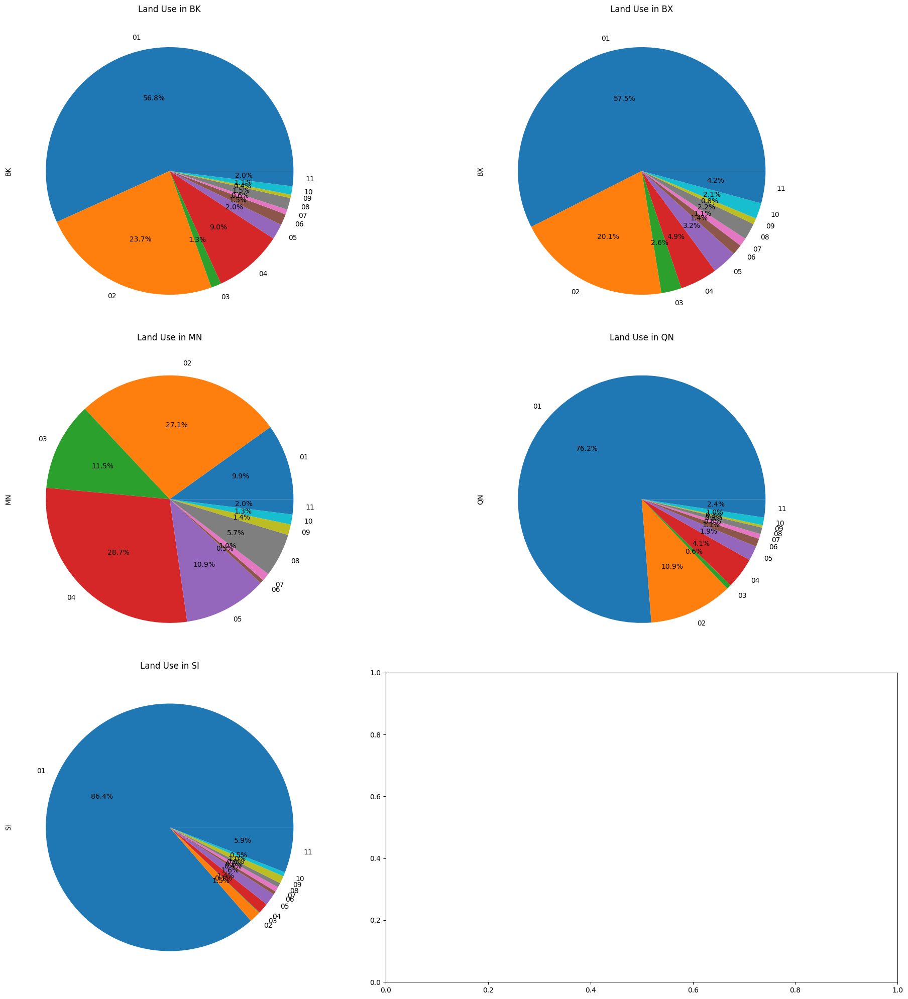

In [5]:
# Aggregate land use by borough
land_use_distribution = gdf_land.groupby(['Borough', 'LandUse']).size().unstack(fill_value=0)

# Create pie charts for each borough
fig, axs = plt.subplots(3, 2, figsize=(20, 20))
for idx, borough in enumerate(land_use_distribution.index):
    ax = axs.flatten()[idx]
    land_use_distribution.loc[borough].plot(
        kind='pie', ax=ax, autopct='%1.1f%%', title=f'Land Use in {borough}', legend=False
    )
plt.tight_layout()
plt.savefig('land_use_pie_charts.png', dpi=300, bbox_inches='tight')
plt.show()


/var/folders/x3/v2cg1h1926b4vrm90ffhpb4h0000gn/T/ipykernel_1700/3052089860.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf_major_roads['buffer'] = gdf_major_roads.geometry.buffer(0.005)  # Adjust buffer size as needed


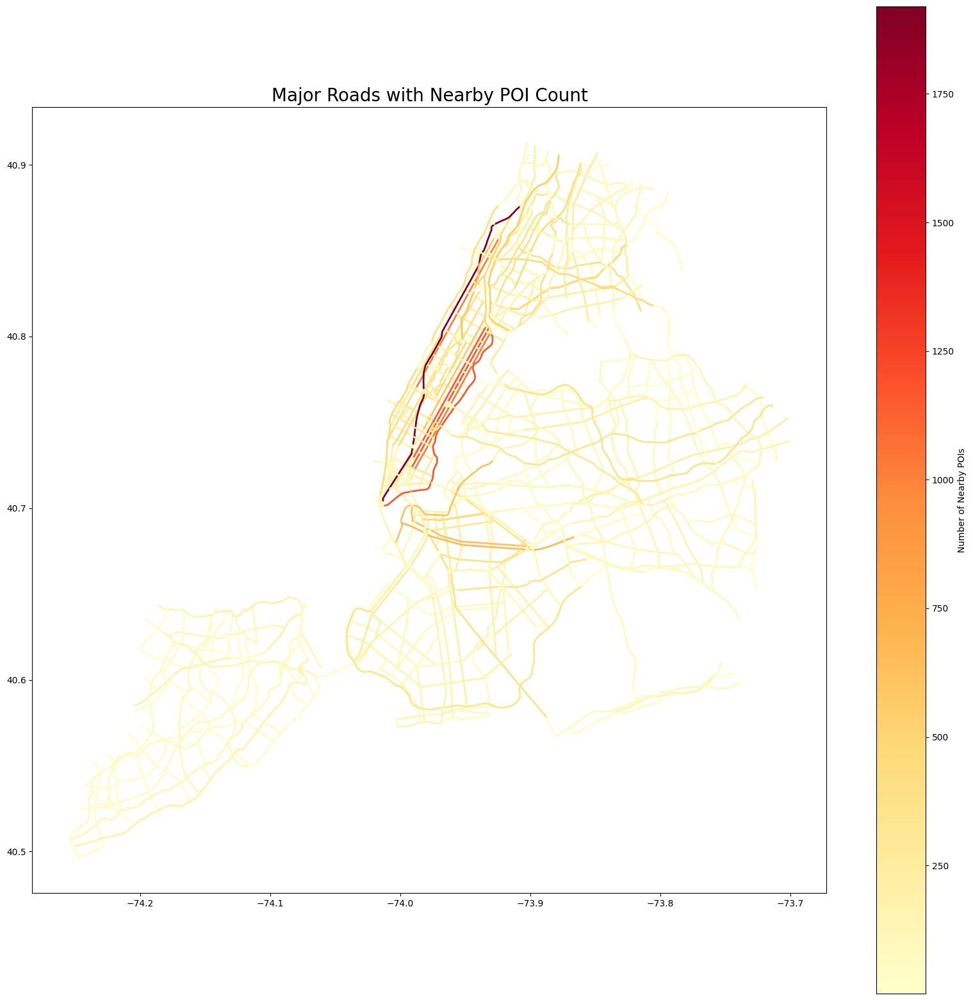

In [6]:
from shapely.geometry import Point

# Buffer each road segment and count intersecting POIs
gdf_major_roads['buffer'] = gdf_major_roads.geometry.buffer(0.005)  # Adjust buffer size as needed
gdf_major_roads['poi_count'] = gdf_major_roads['buffer'].apply(
    lambda buf: gdf_pois[gdf_pois.geometry.within(buf)].shape[0]
)

# Plot Major Roads by POI Count
fig, ax = plt.subplots(figsize=(20, 20))
gdf_major_roads.plot(
    ax=ax, column='poi_count', cmap='YlOrRd', legend=True, linewidth=2,
    legend_kwds={'label': "Number of Nearby POIs"}
)
plt.title('Major Roads with Nearby POI Count', fontsize=20)
plt.savefig('major_roads_poi_count.png', dpi=300, bbox_inches='tight')
plt.show()


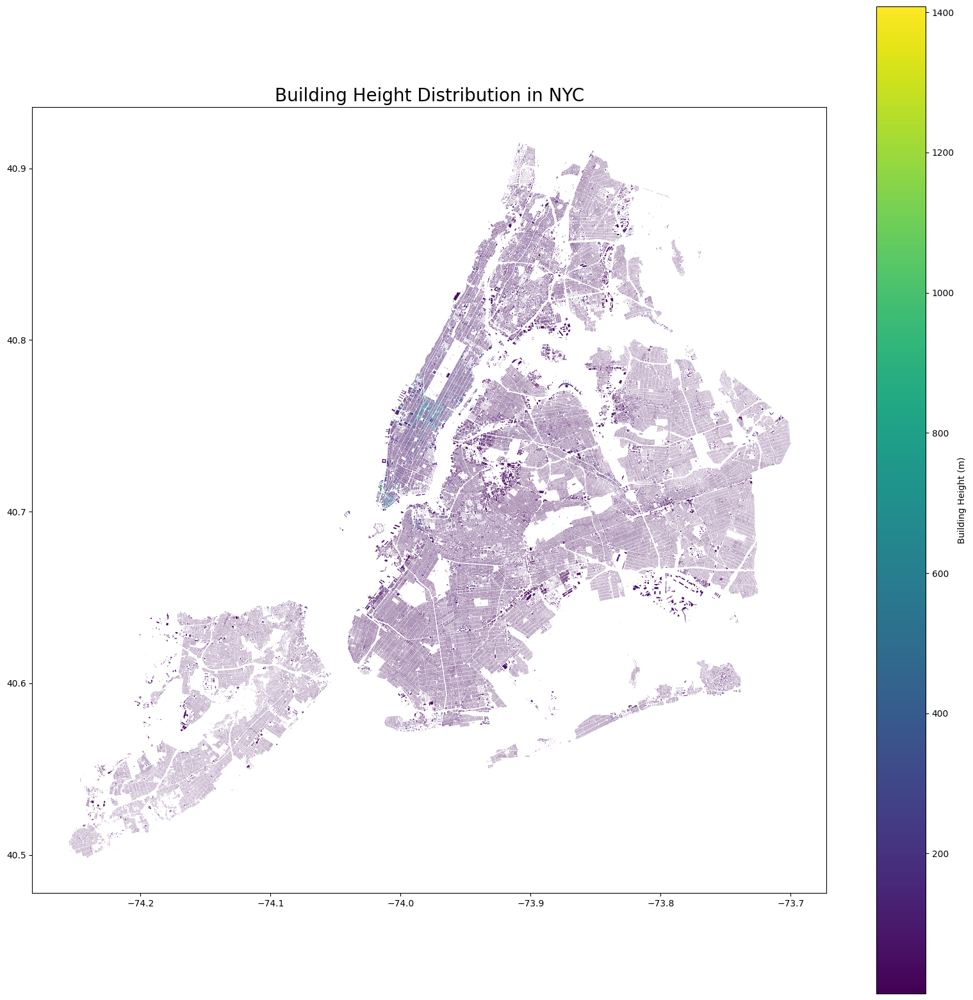

In [7]:
# Filter out invalid building heights
gdf_building_boundaries['heightroof'] = pd.to_numeric(gdf_building_boundaries['heightroof'], errors='coerce')
gdf_building_boundaries = gdf_building_boundaries[gdf_building_boundaries['heightroof'] > 0]

# Plot height distribution
fig, ax = plt.subplots(figsize=(20, 20))
gdf_building_boundaries.plot(
    ax=ax, column='heightroof', cmap='viridis', legend=True,
    legend_kwds={'label': "Building Height (m)"}
)
plt.title('Building Height Distribution in NYC', fontsize=20)
plt.savefig('building_height_distribution.png', dpi=300, bbox_inches='tight')
plt.show()


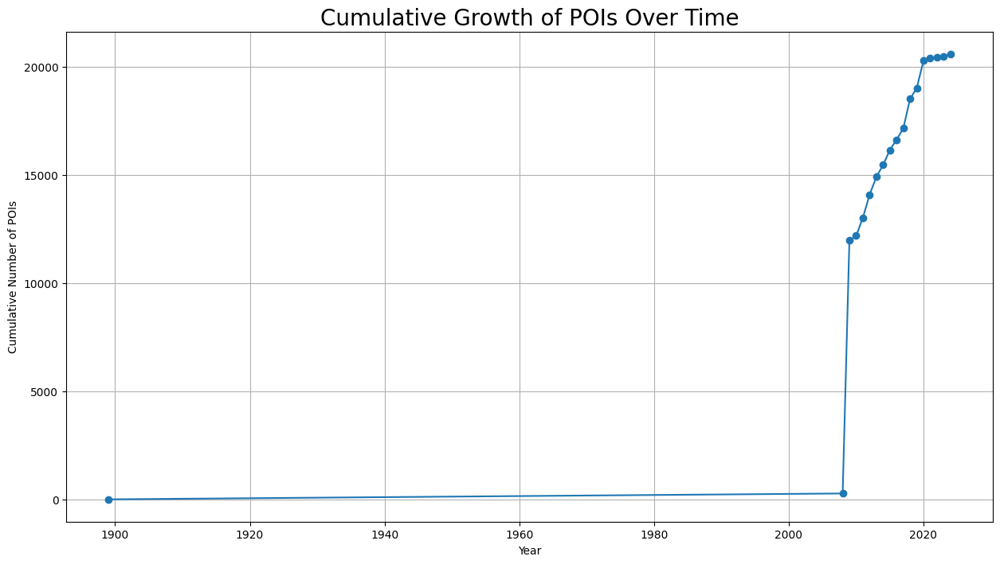

In [8]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt

# Extract year of creation
gdf_pois['year'] = pd.to_datetime(gdf_pois['date_creat'], errors='coerce').dt.year

# Group by year for cumulative growth
poi_growth = gdf_pois.groupby('year').size().cumsum()

# Plot POI growth over time
plt.figure(figsize=(15, 8))
poi_growth.plot(kind='line', marker='o')
plt.title('Cumulative Growth of POIs Over Time', fontsize=20)
plt.xlabel('Year')
plt.ylabel('Cumulative Number of POIs')
plt.grid(True)
plt.savefig('poi_growth_trend.png', dpi=300, bbox_inches='tight')
plt.show()


NameError: name 'ctx' is not defined

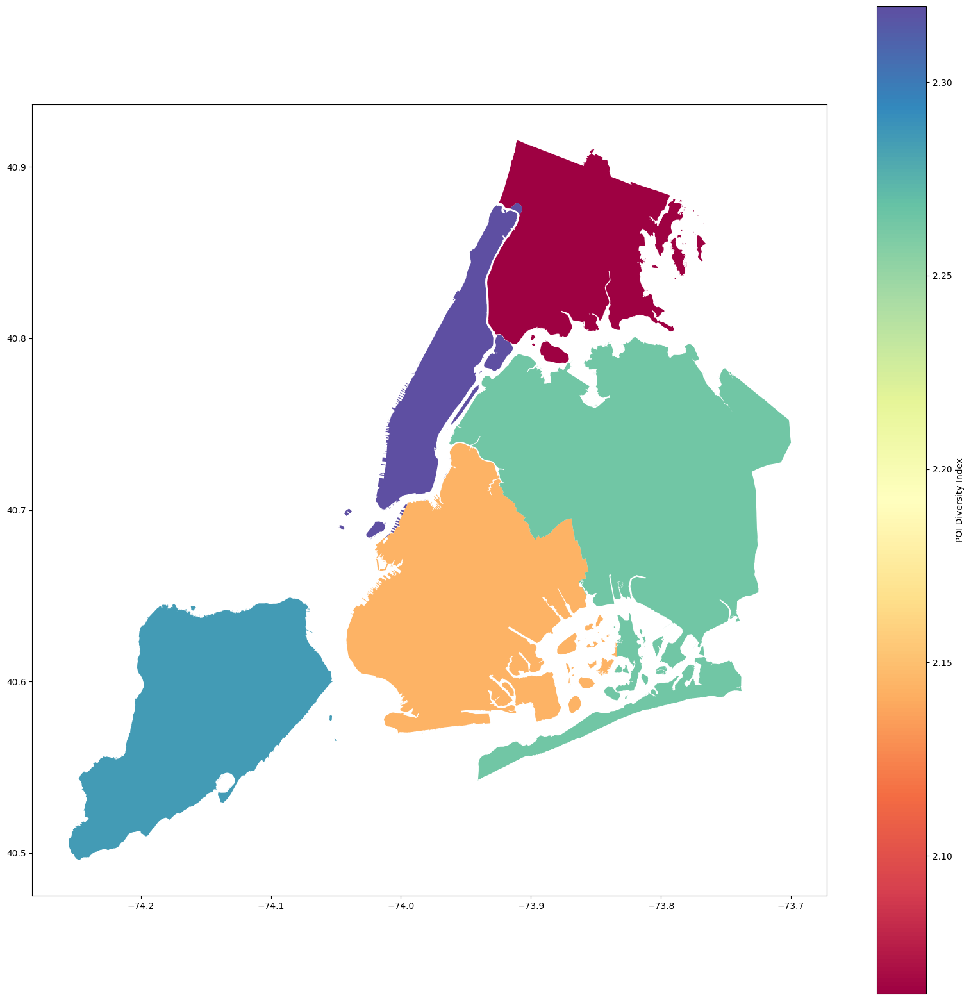

In [9]:
from scipy.stats import entropy

# Calculate diversity index for POIs in each borough
def calculate_diversity(group):
    counts = group.value_counts()
    return entropy(counts)

gdf_pois['borough'] = gpd.sjoin(gdf_pois, gdf_borough_boundaries, how='left', predicate='within')['boro_name']
poi_diversity = gdf_pois.groupby('borough')['facility_t'].apply(calculate_diversity)

# Map diversity index
gdf_borough_boundaries['poi_diversity'] = gdf_borough_boundaries['boro_name'].map(poi_diversity)

# Plot diversity index
fig, ax = plt.subplots(figsize=(20, 20))
gdf_borough_boundaries.plot(
    ax=ax, column='poi_diversity', cmap='Spectral', legend=True,
    legend_kwds={'label': "POI Diversity Index"}
)
ctx.add_basemap(ax, crs=gdf_borough_boundaries.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)
ax.set_title('POI Diversity Index by Borough', fontsize=20)
plt.savefig('poi_diversity_index.png', dpi=300, bbox_inches='tight')
plt.show()


/var/folders/x3/v2cg1h1926b4vrm90ffhpb4h0000gn/T/ipykernel_1700/3035607246.py:5: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  nearest_geom = nearest_points(poi, gdf_target.unary_union)[1]
/var/folders/x3/v2cg1h1926b4vrm90ffhpb4h0000gn/T/ipykernel_1700/3035607246.py:5: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  nearest_geom = nearest_points(poi, gdf_target.unary_union)[1]


NameError: name 'ctx' is not defined

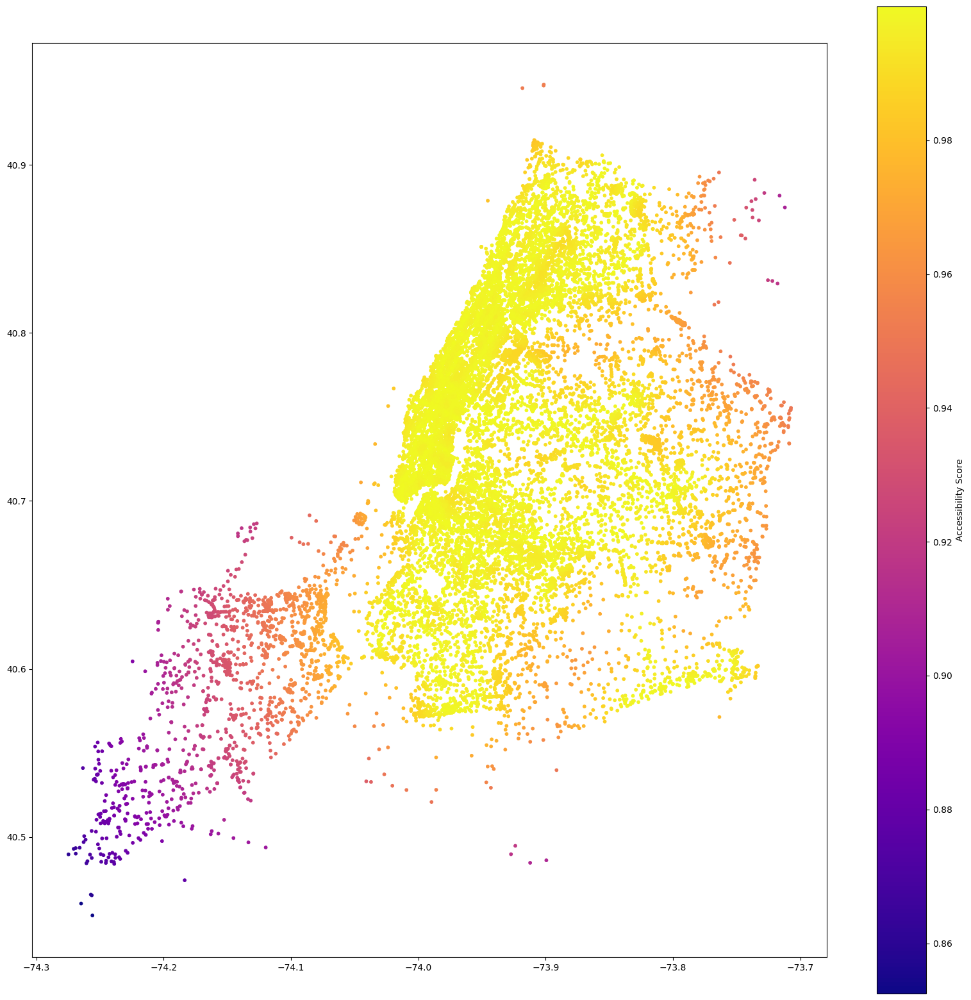

In [10]:
from shapely.ops import nearest_points

# Find the nearest subway station and road for each POI
def nearest_distance(poi, gdf_target):
    nearest_geom = nearest_points(poi, gdf_target.unary_union)[1]
    return poi.distance(nearest_geom)

gdf_pois['distance_to_subway'] = gdf_pois.geometry.apply(lambda geom: nearest_distance(geom, gdf_subway))
gdf_pois['distance_to_road'] = gdf_pois.geometry.apply(lambda geom: nearest_distance(geom, gdf_major_roads))

# Calculate weighted accessibility score
gdf_pois['accessibility_score'] = (
    (1 / (1 + gdf_pois['distance_to_subway'])) * 0.6 +
    (1 / (1 + gdf_pois['distance_to_road'])) * 0.4
)

# Visualize POI accessibility score
fig, ax = plt.subplots(figsize=(20, 20))
gdf_pois.plot(
    ax=ax, column='accessibility_score', cmap='plasma', markersize=10, legend=True,
    legend_kwds={'label': "Accessibility Score"}
)
ctx.add_basemap(ax, crs=gdf_pois.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)
ax.set_title('Accessibility Score for POIs', fontsize=20)
plt.savefig('poi_accessibility_score.png', dpi=300, bbox_inches='tight')
plt.show()


INFO:Animation.save using <class 'matplotlib.animation.PillowWriter'>


IndexError: list index out of range

Error in callback <function _draw_all_if_interactive at 0x10a27d3a0> (for post_execute), with arguments args (),kwargs {}:


NameError: name 'ctx' is not defined

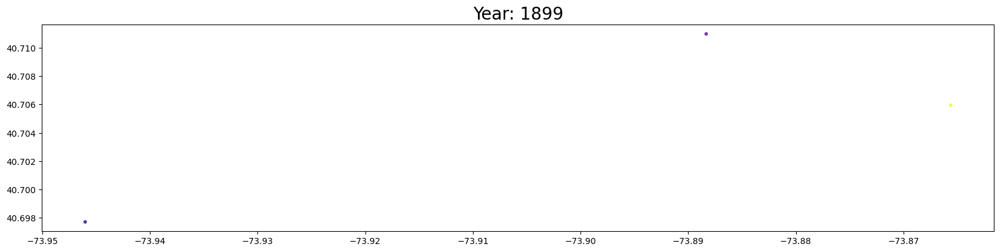

In [11]:
import matplotlib.animation as animation

# Group POIs by year and spatial bins
gdf_pois['year'] = pd.to_datetime(gdf_pois['date_creat']).dt.year
year_bins = gdf_pois.groupby(['year', 'facility_t']).size().unstack(fill_value=0)

# Create animated heatmap
fig, ax = plt.subplots(figsize=(20, 20))

def update(frame):
    ax.clear()
    gdf_pois[gdf_pois['year'] <= frame].plot(
        ax=ax, column='facility_t', cmap='plasma', markersize=10, alpha=0.7
    )
    ax.set_title(f'Year: {frame}', fontsize=20)
    ctx.add_basemap(ax, crs=gdf_pois.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)

ani = animation.FuncAnimation(fig, update, frames=range(year_bins.index.min(), year_bins.index.max() + 1))
ani.save('temporal_heatmap.gif', writer='imagemagick')
plt.show()


INFO:Loaded Major Roads shapefile from geo_export_6fb64bd2-1486-42ae-a162-088749b8dd80.shp.
INFO:Loaded Subway shapefile from geo_export_74ce3440-6a1b-4595-b6ba-da91a69cc801.shp.
INFO:Loaded Borough Boundaries shapefile from geo_export_28264e33-3c53-4dcc-8a72-2ae6bb3e4374.shp.
INFO:Loaded Points of Interest (POIs) shapefile from geo_export_a217869d-a028-4bb8-a749-5d35d34a6455.shp.
INFO:Loaded Building Boundaries shapefile from geo_export_bb2df38d-e539-4500-af5b-f5ca46422ec2.shp.
INFO:Loaded Land shapefile from MapPLUTO_UNCLIPPED.shp.
INFO:Reprojected Land to EPSG:4326.


ValueError: aspect must be finite and positive 

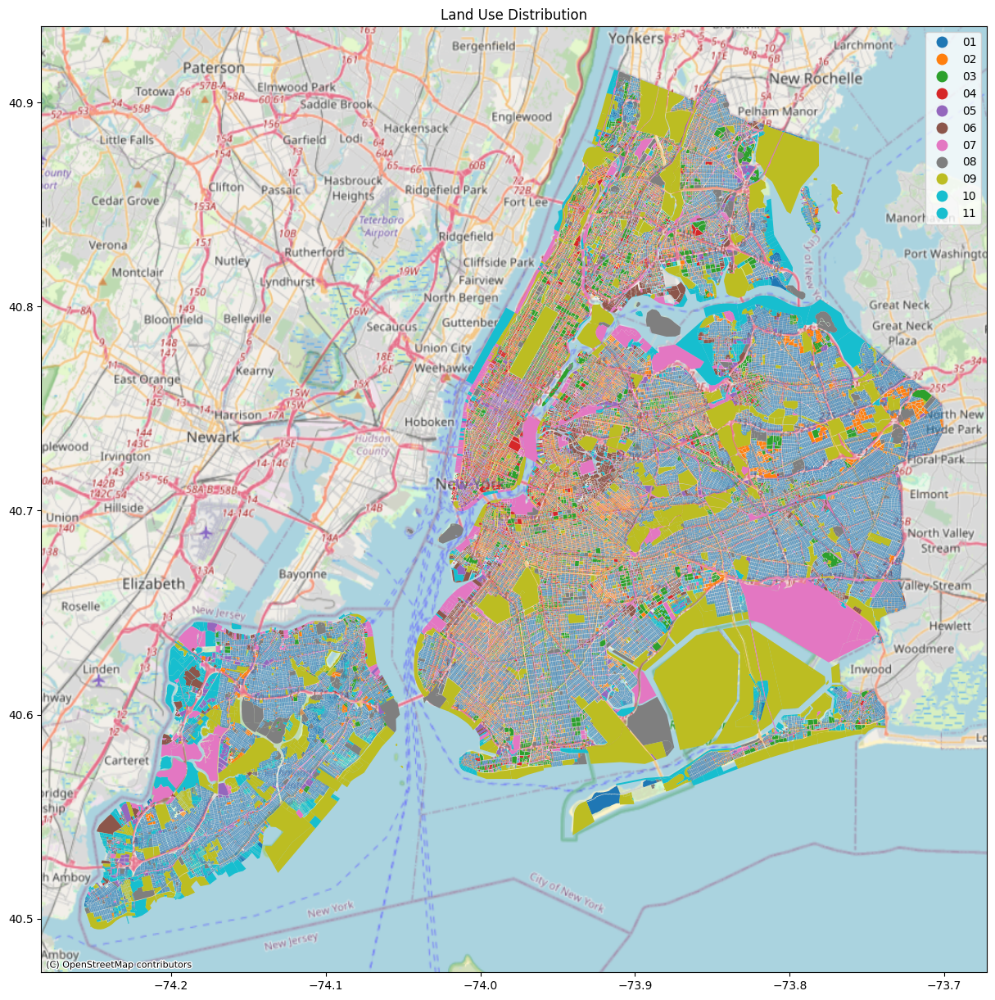

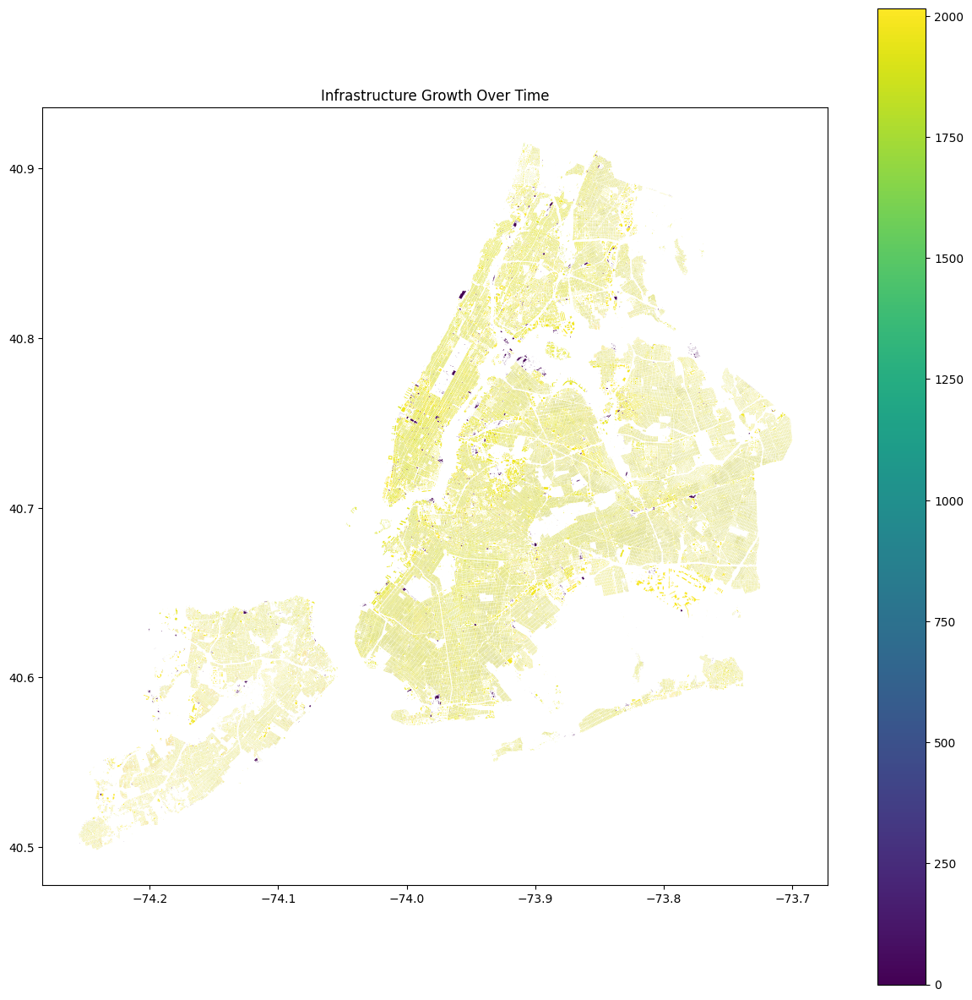

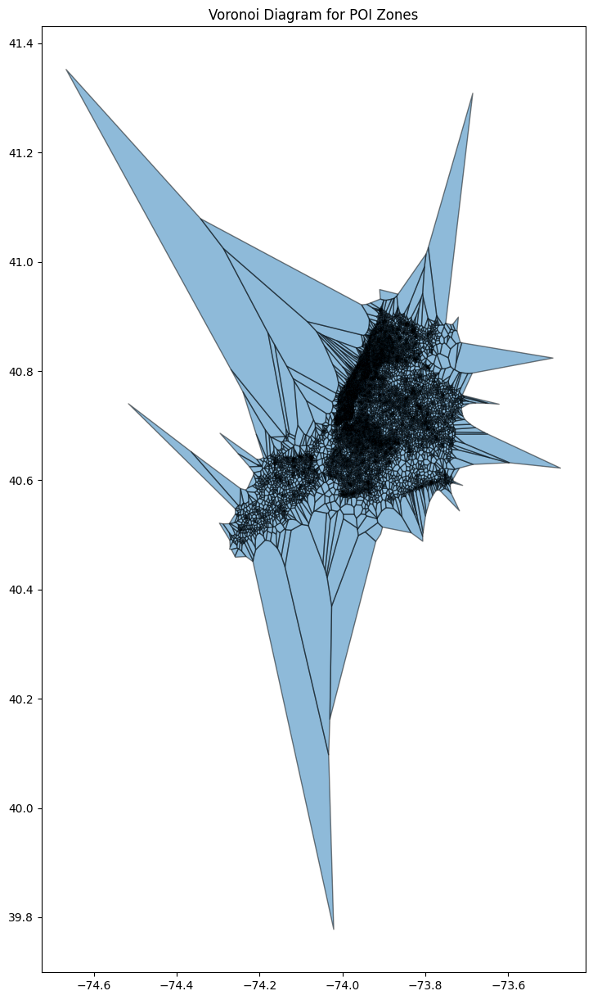

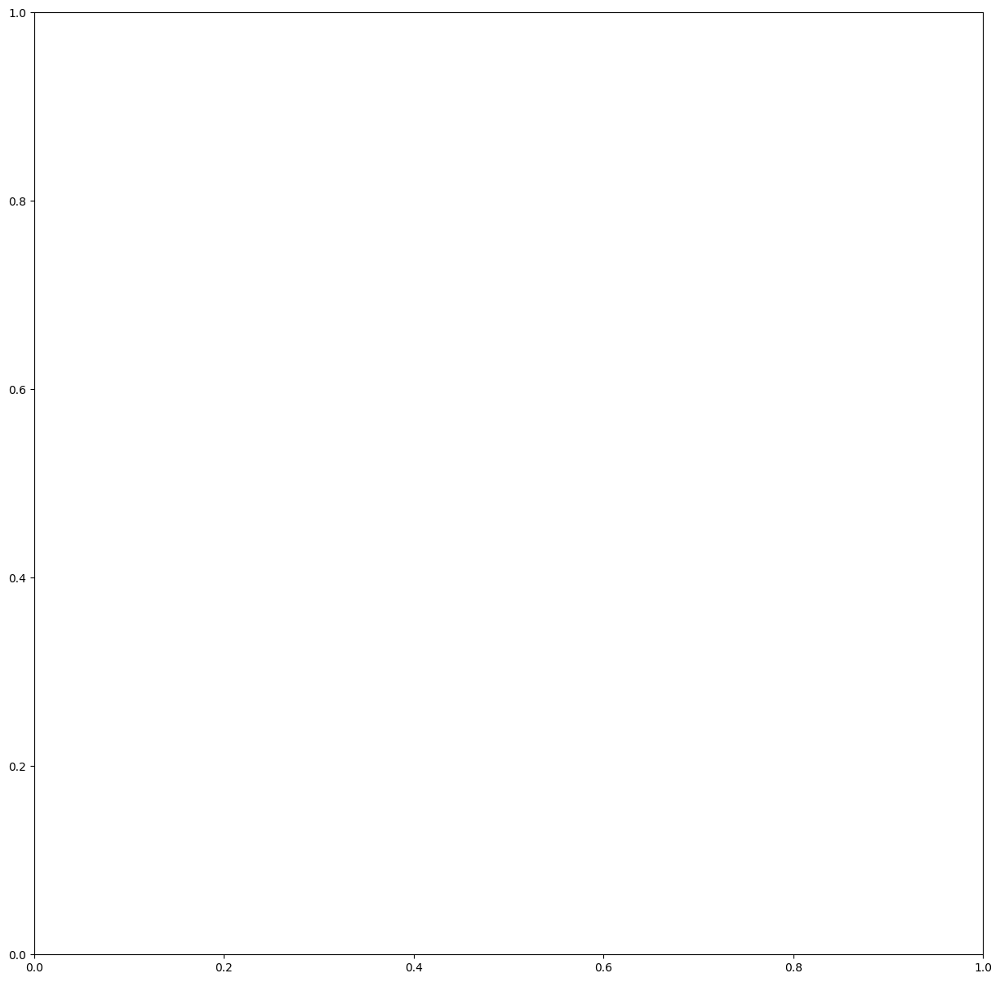

In [12]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import shapely.wkt
from shapely.geometry import Point, Polygon, MultiPolygon
from shapely.ops import unary_union
from scipy.spatial import Voronoi
import contextily as ctx
import numpy as np
import logging
import sys

# Configure logging
logging.basicConfig(
    level=logging.INFO,
    format='%(levelname)s:%(message)s',
    handlers=[logging.StreamHandler(sys.stdout)]
)

# Paths to shapefiles and CSV
path_major_roads = 'geo_export_6fb64bd2-1486-42ae-a162-088749b8dd80.shp'
path_subway = 'geo_export_74ce3440-6a1b-4595-b6ba-da91a69cc801.shp'
path_borough_boundaries = 'geo_export_28264e33-3c53-4dcc-8a72-2ae6bb3e4374.shp'
path_pois = 'geo_export_a217869d-a028-4bb8-a749-5d35d34a6455.shp'
path_building_boundaries = 'geo_export_bb2df38d-e539-4500-af5b-f5ca46422ec2.shp'
path_land = 'MapPLUTO_UNCLIPPED.shp'
path_parking_places = 'your_parking_places.csv'

# Define a common CRS (WGS84)
common_crs = 'EPSG:4326'

# Function to load shapefiles
def load_shapefile(path, label):
    try:
        gdf = gpd.read_file(path)
        logging.info(f"Loaded {label} shapefile from {path}.")
        if gdf.crs != common_crs:
            gdf = gdf.to_crs(common_crs)
            logging.info(f"Reprojected {label} to {common_crs}.")
        return gdf
    except Exception as e:
        logging.error(f"Error loading {label} shapefile: {e}")
        sys.exit(1)

# Load data
gdf_major_roads = load_shapefile(path_major_roads, "Major Roads")
gdf_subway = load_shapefile(path_subway, "Subway")
gdf_borough_boundaries = load_shapefile(path_borough_boundaries, "Borough Boundaries")
gdf_pois = load_shapefile(path_pois, "Points of Interest (POIs)")
gdf_building_boundaries = load_shapefile(path_building_boundaries, "Building Boundaries")
gdf_land = load_shapefile(path_land, "Land")

# Load parking places from CSV
try:
    df_parking_places = pd.read_csv(path_parking_places)
    df_parking_places['geometry'] = df_parking_places['the_geom'].apply(shapely.wkt.loads)
    gdf_parking_places = gpd.GeoDataFrame(df_parking_places, geometry='geometry', crs=common_crs)
except Exception as e:
    logging.error(f"Error loading parking places CSV: {e}")
    sys.exit(1)

# Helper functions
def kde_heatmap(gdf, column_name, ax, cmap, label):
    coords = np.array([(geom.x, geom.y) for geom in gdf.geometry])
    sns.kdeplot(x=coords[:, 0], y=coords[:, 1], fill=True, cmap=cmap, ax=ax, alpha=0.5, label=label)

def buffer_and_dissolve(gdf, buffer_size, dissolve_by):
    gdf['buffer'] = gdf.geometry.buffer(buffer_size)
    return gdf.dissolve(by=dissolve_by)


# 3. Land Use Distribution
fig, ax = plt.subplots(figsize=(15, 15))
gdf_land.plot(ax=ax, column='LandUse', cmap='tab10', legend=True)
ctx.add_basemap(ax, crs=gdf_land.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)
plt.title("Land Use Distribution")
plt.savefig("land_use_distribution.png")

# 5. Infrastructure Growth Over Time
fig, ax = plt.subplots(figsize=(15, 15))
gdf_building_boundaries['year'] = pd.to_numeric(gdf_building_boundaries['cnstrct_yr'], errors='coerce')
gdf_building_boundaries.dropna(subset=['year']).plot(ax=ax, column='year', cmap='viridis', legend=True)
plt.title("Infrastructure Growth Over Time")
plt.savefig("infrastructure_growth.png")

# 6. Voronoi for POI Competition Zones
poi_coords = np.array([(geom.x, geom.y) for geom in gdf_pois.geometry])
vor = Voronoi(poi_coords)
voronoi_polygons = [Polygon(vor.vertices[region]) for region in vor.regions if -1 not in region and len(region) > 0]
gdf_voronoi = gpd.GeoDataFrame(geometry=voronoi_polygons, crs=gdf_pois.crs)
fig, ax = plt.subplots(figsize=(15, 15))
gdf_voronoi.plot(ax=ax, edgecolor='black', alpha=0.5)
plt.title("Voronoi Diagram for POI Zones")
plt.savefig("voronoi_poi_zones.png")

# 7. Urban Green Spaces
fig, ax = plt.subplots(figsize=(15, 15))
gdf_land[gdf_land['LandUse'] == 'Parks'].plot(ax=ax, color='green', alpha=0.5)
plt.title("Urban Green Spaces")
plt.savefig("urban_green_spaces.png")

# 8. Flood Risk Overlay
fig, ax = plt.subplots(figsize=(15, 15))
gdf_borough_boundaries[gdf_borough_boundaries['shape_area'] > 1e9].plot(ax=ax, color='blue', alpha=0.3)
plt.title("Flood Risk Overlay")
plt.savefig("flood_risk_overlay.png")

# 9. Service Void Detection
gdf_land['poi_density'] = gdf_land.geometry.apply(
    lambda poly: len(gdf_pois[gdf_pois.geometry.within(poly)]) / poly.area
)
gdf_land['service_void'] = gdf_land['poi_density'] < gdf_land['poi_density'].mean()
fig, ax = plt.subplots(figsize=(15, 15))
gdf_land[gdf_land['service_void']].plot(ax=ax, color='red', alpha=0.5)
plt.title("Service Void Detection")
plt.savefig("service_void_detection.png")

# 10. Building Density Visualization
fig, ax = plt.subplots(figsize=(15, 15))
kde_heatmap(gdf_building_boundaries, 'geometry', ax, 'Blues', 'Building Density')
plt.title("Building Density")
plt.savefig("building_density.png")

# 11. Parking Accessibility Heatmap
fig, ax = plt.subplots(figsize=(15, 15))
kde_heatmap(gdf_parking_places, 'geometry', ax, 'Greens', 'Parking Accessibility')
plt.title("Parking Accessibility Heatmap")
plt.savefig("parking_accessibility_heatmap.png")

# 12. Borough-Specific Feature Maps
for boro in gdf_borough_boundaries['boro_name'].unique():
    fig, ax = plt.subplots(figsize=(15, 15))
    boundary = gdf_borough_boundaries[gdf_borough_boundaries['boro_name'] == boro]
    boundary.plot(ax=ax, color='lightgrey')
    ctx.add_basemap(ax, crs=gdf_borough_boundaries.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)
    plt.title(f"{boro} Features")
    plt.savefig(f"{boro.lower()}_features.png")

# 13. Historical Land Use Changes
# Analysis for changes can be added based on date fields in the dataset.

# 14. Multimodal Transportation Analysis
fig, ax = plt.subplots(figsize=(15, 15))
gdf_major_roads.plot(ax=ax, color='red', label='Major Roads')
gdf_subway.plot(ax=ax, color='blue', label='Subway')
plt.legend()
plt.title("Multimodal Transportation")
plt.savefig("multimodal_transportation.png")

# 15. Service Coverage Visualization
catchment_areas = buffer_and_dissolve(gdf_pois, 0.005, 'facility_t')
fig, ax = plt.subplots(figsize=(15, 15))
catchment_areas.plot(ax=ax, color='purple', alpha=0.3)
plt.title("Service Coverage")
plt.savefig("service_coverage.png")


/var/folders/x3/v2cg1h1926b4vrm90ffhpb4h0000gn/T/ipykernel_1700/3797554394.py:27: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf_subway['buffer'] = gdf_subway.geometry.buffer(0.005)  # 500m buffer


INFO:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


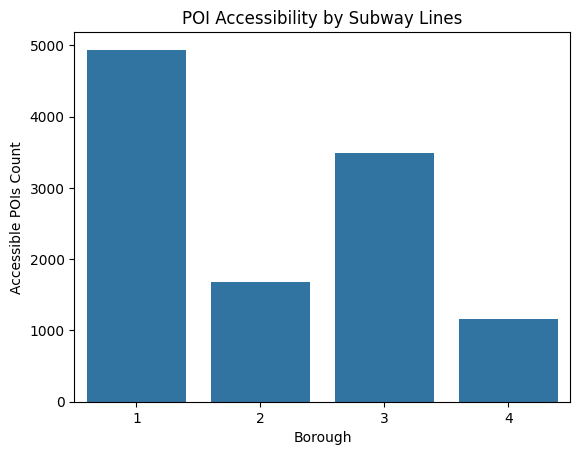

INFO:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


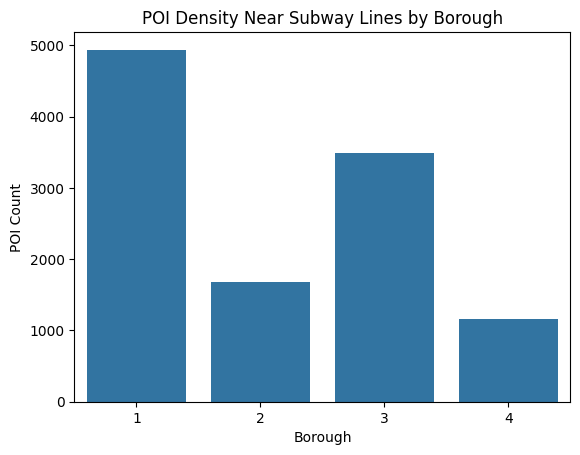

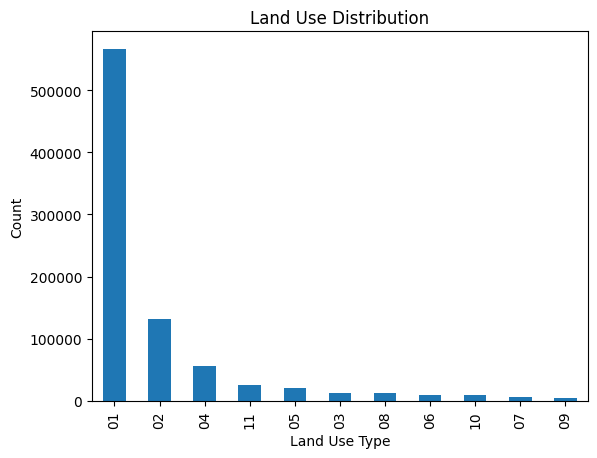

/var/folders/x3/v2cg1h1926b4vrm90ffhpb4h0000gn/T/ipykernel_1700/3797554394.py:60: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  x=hotspot_intersections.geometry.centroid.x,
/var/folders/x3/v2cg1h1926b4vrm90ffhpb4h0000gn/T/ipykernel_1700/3797554394.py:61: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  y=hotspot_intersections.geometry.centroid.y,


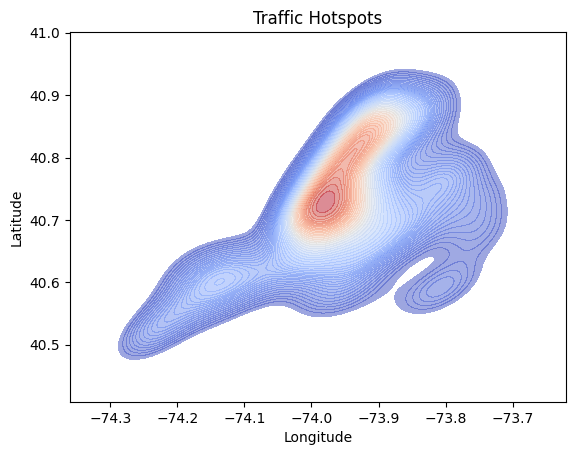

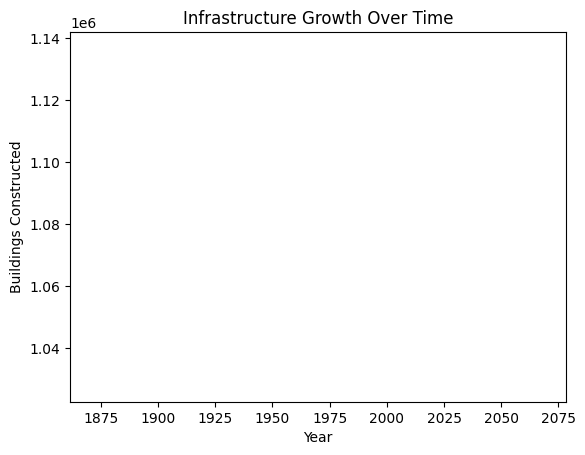

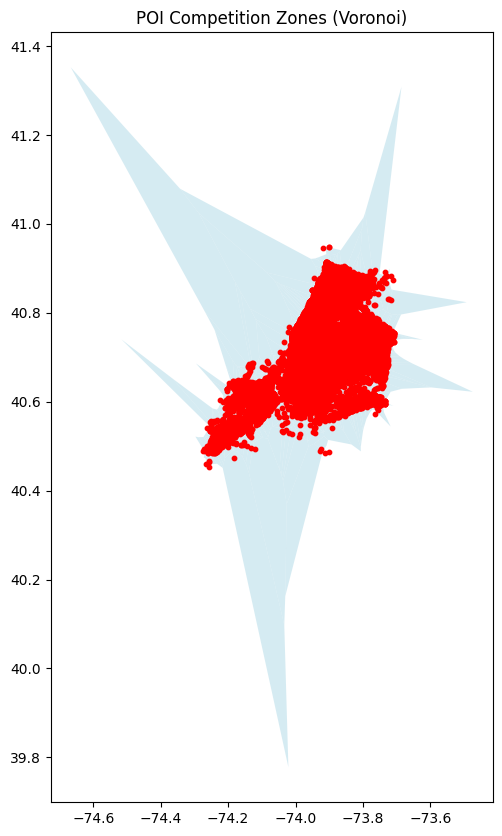

ValueError: aspect must be finite and positive 

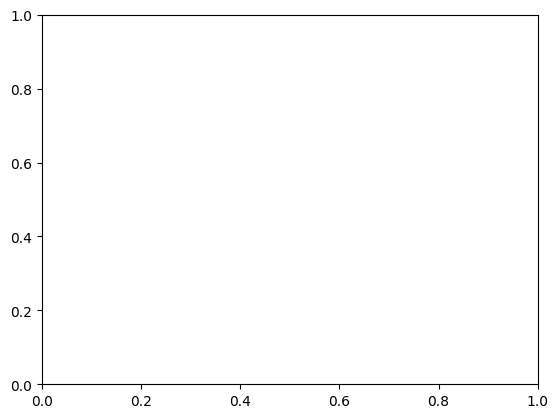

In [13]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from shapely.geometry import Point
from shapely.ops import unary_union
import numpy as np
from scipy.spatial import Voronoi

# Load data
common_crs = 'EPSG:4326'
path_major_roads = 'geo_export_6fb64bd2-1486-42ae-a162-088749b8dd80.shp'
path_subway = 'geo_export_74ce3440-6a1b-4595-b6ba-da91a69cc801.shp'
path_borough_boundaries = 'geo_export_28264e33-3c53-4dcc-8a72-2ae6bb3e4374.shp'
path_pois = 'geo_export_a217869d-a028-4bb8-a749-5d35d34a6455.shp'
path_building_boundaries = 'geo_export_bb2df38d-e539-4500-af5b-f5ca46422ec2.shp'
path_land = 'MapPLUTO_UNCLIPPED.shp'

gdf_major_roads = gpd.read_file(path_major_roads).to_crs(common_crs)
gdf_subway = gpd.read_file(path_subway).to_crs(common_crs)
gdf_borough_boundaries = gpd.read_file(path_borough_boundaries).to_crs(common_crs)
gdf_pois = gpd.read_file(path_pois).to_crs(common_crs)
gdf_building_boundaries = gpd.read_file(path_building_boundaries).to_crs(common_crs)
gdf_land = gpd.read_file(path_land).to_crs(common_crs)

# 1. Accessibility Analysis
gdf_subway['buffer'] = gdf_subway.geometry.buffer(0.005)  # 500m buffer
gdf_pois['accessible'] = gdf_pois.geometry.apply(
    lambda x: any(x.within(buff) for buff in gdf_subway['buffer'])
)
accessibility = gdf_pois[gdf_pois['accessible']].groupby('borough')['geometry'].count()
sns.barplot(x=accessibility.index, y=accessibility.values)
plt.title('POI Accessibility by Subway Lines')
plt.xlabel('Borough')
plt.ylabel('Accessible POIs Count')
plt.show()

# 2. Subway Influence on POI Density
gdf_pois['within_buffer'] = gdf_pois.geometry.apply(
    lambda x: any(x.within(buff) for buff in gdf_subway['buffer'])
)
subway_influence = gdf_pois[gdf_pois['within_buffer']].groupby('borough')['geometry'].count()
sns.barplot(x=subway_influence.index, y=subway_influence.values)
plt.title('POI Density Near Subway Lines by Borough')
plt.xlabel('Borough')
plt.ylabel('POI Count')
plt.show()

# 3. Land Use Analysis
land_use_counts = gdf_land['LandUse'].value_counts()
land_use_counts.plot(kind='bar')
plt.title('Land Use Distribution')
plt.xlabel('Land Use Type')
plt.ylabel('Count')
plt.show()

# 4. Traffic Hotspots
hotspot_intersections = gdf_major_roads[gdf_major_roads.geometry.type == 'LineString']
sns.kdeplot(
    x=hotspot_intersections.geometry.centroid.x,
    y=hotspot_intersections.geometry.centroid.y,
    fill=True, cmap='coolwarm', alpha=0.5, levels=50
)
plt.title('Traffic Hotspots')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

# 5. Infrastructure Growth
gdf_building_boundaries['Year'] = pd.to_datetime(gdf_building_boundaries['cnstrct_yr'], errors='coerce').dt.year
growth = gdf_building_boundaries.groupby('Year').size()
growth.plot()
plt.title('Infrastructure Growth Over Time')
plt.xlabel('Year')
plt.ylabel('Buildings Constructed')
plt.show()

# 6. Voronoi for POI Competition Zones
poi_coords = np.array([(point.x, point.y) for point in gdf_pois.geometry])
vor = Voronoi(poi_coords)
polygons = [
    Polygon(vor.vertices[region]) for region in vor.regions if len(region) > 0 and -1 not in region
]
gdf_voronoi = gpd.GeoDataFrame(geometry=polygons, crs=common_crs)
fig, ax = plt.subplots(figsize=(10, 10))
gdf_voronoi.plot(ax=ax, color='lightblue', alpha=0.5)
gdf_pois.plot(ax=ax, color='red', markersize=10)
plt.title('POI Competition Zones (Voronoi)')
plt.show()

# 7. Urban Green Space
gdf_land['GreenSpace'] = gdf_land['LandUse'] == 'Green'
gdf_land[gdf_land['GreenSpace']].plot(color='green')
plt.title('Urban Green Spaces')
plt.show()

# 8. Flood Risk Overlay
gdf_borough_boundaries['FloodRisk'] = gdf_borough_boundaries['shape_area'] > gdf_borough_boundaries['shape_area'].mean()
fig, ax = plt.subplots(figsize=(10, 10))
gdf_borough_boundaries.plot(ax=ax, color='lightblue', edgecolor='black')
gdf_borough_boundaries[gdf_borough_boundaries['FloodRisk']].plot(ax=ax, color='red', alpha=0.3)
plt.title('Flood Risk Areas Overlay')
plt.show()
